## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1.First, I'll compute the camera calibration using chessboard images

20


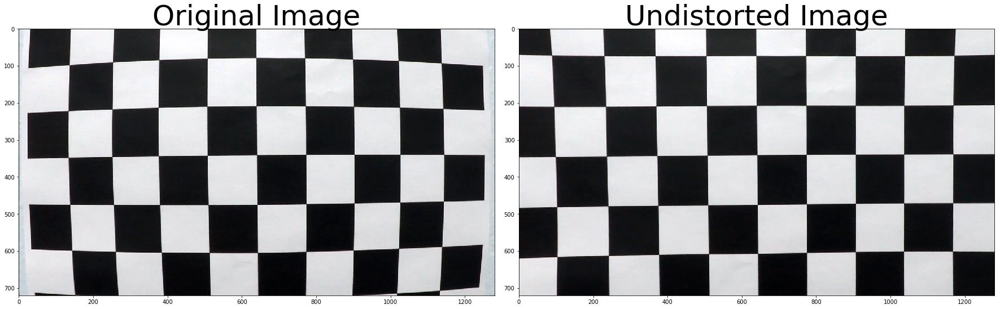

In [3]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

print (len(images))

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    #print (str(ret))
    # If found, add object points, image points
    if ret == True:
        #print ("test image "+fname)
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        output_name= './output_images/corners/corners_detected_' + str(idx) + ".jpg"
        cv2.imwrite(output_name,img)

img = cv2.imread("./camera_cal/calibration1.jpg")
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,img_size,None,None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
cv2.imwrite("./output_images/undistorted/undistorted_calibration1.jpg",undistorted)

# save the calibration results
dist_pickle = {}
dist_pickle["mtx"]=mtx
dist_pickle["dist"]=dist
pickle.dump(dist_pickle, open("./calibration_pickle.p", "wb"))




### .Get undistorted and warped chessboard images

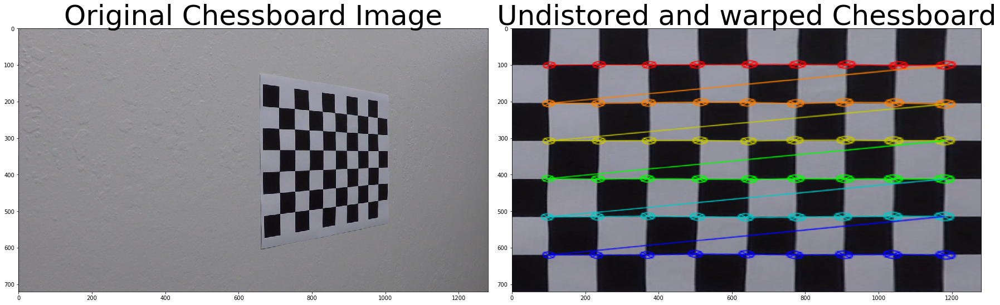

In [8]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    M = None
    warped = None
    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

images = glob.glob('./camera_cal/calibration*.jpg')
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
img = None
top_down = None
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
    if top_down is not None:
        cv2.imwrite("./output_images/undistorted_warped/undistorted_warped_calibration" + str(idx)+".jpg",top_down)

if top_down is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Chessboard Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(top_down, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistored and warped Chessboard', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

## 2.Apply a distortion correction to raw images.

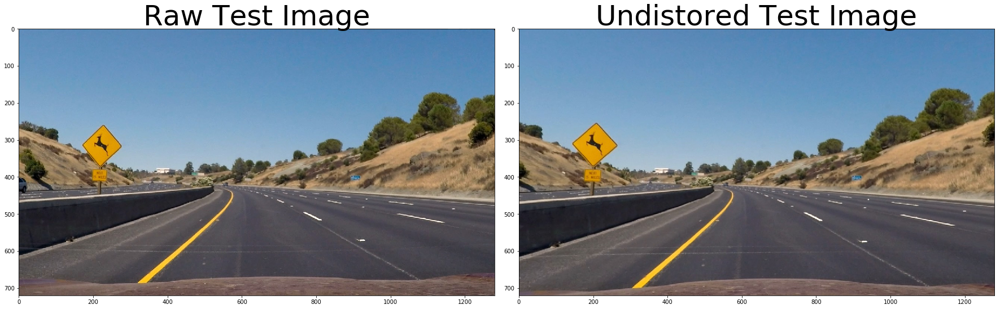

In [9]:
# Read in the saved objpoints and imgpoints
dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Make a list of test images
images = glob.glob('./test_images/test*.jpg')
img = None
undistorted = None
# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite("./output_images/undistorted_test/undistorted_test_"+str(idx)+".jpg",undistorted)

if undistorted is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistored Test Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

## 3.Use color transforms, gradients, etc., to create a thresholded binary image.

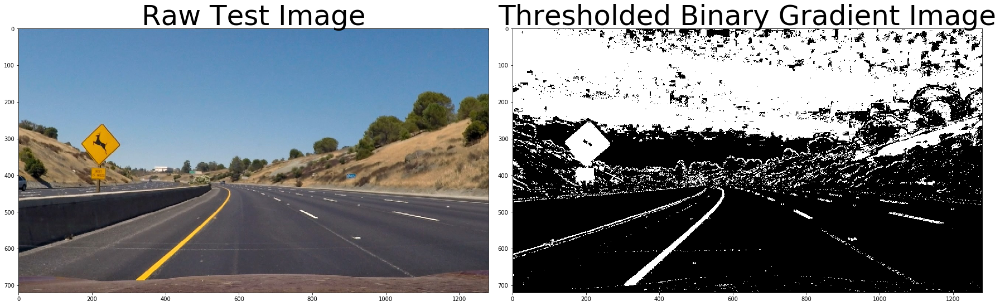

In [16]:

# Read in the saved objpoints and imgpoints
dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

### used in final code
### NOTE: code is derived from the course materials
def combine_gradient_color_s_channel(img, s_thresh=(100, 255),
                                     v_thresh=(50,255), 
                                     sx_thresh=(12, 255),
                                     sy_thresh=(20, 255)):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x Taking the gradient in the x direction emphasizes edges closer to vertical. 
    # Alternatively, taking the gradient in the y direction emphasizes edges closer to horizontal.
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_x = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel_x)
    sxbinary[(scaled_sobel_x >= sx_thresh[0]) & (scaled_sobel_x <= sx_thresh[1])] = 1
    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobely = np.absolute(sobely) # Absolute y derivative to accentuate lines away from vertical
    scaled_sobel_y = np.uint8(255*abs_sobely/np.max(abs_sobely))

    # Threshold y gradient
    sybinary = np.zeros_like(scaled_sobel_y)
    sybinary[(scaled_sobel_y >= sy_thresh[0]) & (scaled_sobel_y <= sy_thresh[1])] = 1

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Threshold color channel for s channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= v_thresh[0]) & (v_channel <= v_thresh[1])] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[((s_binary == 1) & (v_binary == 1)) | ((sxbinary == 1) & (sybinary ==1)) ] = 255

    return combined_binary

# Make a list of test images
images = glob.glob('./test_images/test*.jpg')
img = None
combined_binary= None
# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    cv2.imwrite("./output_images/thresholded_binary/thresholded_binary_"+str(idx)+".jpg",combined_binary)

if combined_binary is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(combined_binary, cmap=plt.get_cmap('gray'))
    ax2.set_title('Thresholded Binary Gradient Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

## 4.Apply a perspective transform to rectify binary image ("birds-eye view").

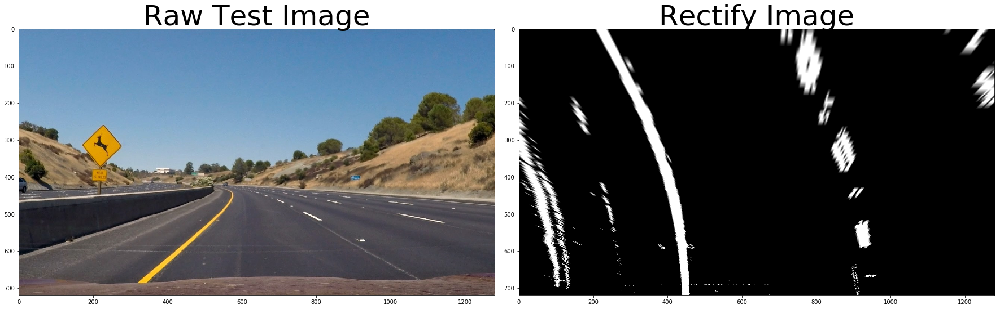

In [20]:
# Make a list of test images
images = glob.glob('./test_images/test*.jpg')

### used in final code
def find_warped_birdeye_img(img):
    img_size = (img.shape[1], img.shape[0])
    bottom_width = 0.76  # percent of bottom trapizoid width
    middle_width = 0.08  # percent of middle trapizoid width
    
    height_pct =0.62 # pct of trapizoid height
    bottom_trim = 0.93 # pct from top to bottom to exclude car hood
    
    # Compute the perspective transform, M, given source and destination points:
    src = np.float32([[img.shape[1]*(0.5-middle_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(0.5+middle_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(0.5+bottom_width/2),img.shape[0]*bottom_trim],
                      [img.shape[1]*(0.5-bottom_width/2),img.shape[0]*bottom_trim]])
    
    offset = img_size[0]*0.25
    dst = np.float32([[offset, 0], 
                      [img_size[0]-offset, 0], 
                      [img_size[0]-offset, img_size[1]], 
                      [offset, img_size[1]]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(combined_binary, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv
img = None
warped = None
# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    cv2.imwrite("./output_images/perspective_birdeye/birdeye_"+str(idx)+".jpg",warped)

if warped is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(warped, cmap=plt.get_cmap('gray'))
    ax2.set_title('Rectify Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)       

## 5.Detect lane pixels and fit to find the lane boundary. 

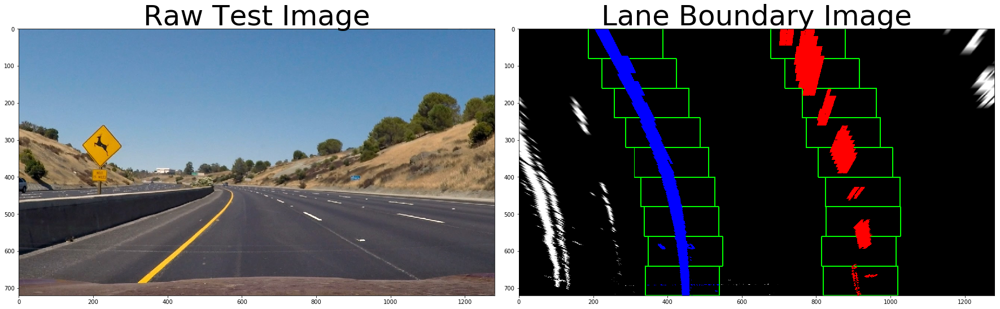

In [23]:
## NOTE: this is the method from the course material
### used in final code
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

### used in final code
def measure_curvature_pixels(ploty, left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def fit_polynomial_output_lane_regions(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit_cr[0]*ploty**2 + left_fit_cr[1]*ploty + left_fit_cr[2]
        right_fitx = right_fit_cr[0]*ploty**2 + right_fit_cr[1]*ploty + right_fit_cr[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # calculate curvature
    left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit_cr, right_fit_cr)
    return out_img, left_curverad, right_curverad
img = None
lane_boundary_img = None
# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    lane_boundary_img, left_curverad, right_curverad = fit_polynomial_output_lane_regions(warped)
    cv2.imwrite("./output_images/fit_polynomial/lane_boundary_"+str(idx)+".jpg",lane_boundary_img)

if lane_boundary_img is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(lane_boundary_img, cv2.COLOR_BGR2RGB))
    ax2.set_title('Lane Boundary Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)   

## 6.Determine the curvature of the lane and vehicle position with respect to center.

In [24]:
### calculate the offset of the car on the road, 
### used in final code
def calculate_camera_center(warped, left_fitx, right_fitx):
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if center_diff <=0:
        side_pos = 'right'
    return center_diff, side_pos

# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    out_img, left_curverad, right_curverad = fit_polynomial_output_lane_regions(warped)
    print(left_curverad, 'm', right_curverad, 'm')

796.475203291 m 1075.69349485 m
485.297234658 m 385.745006806 m
1250.81477136 m 559.828081894 m
3526.01173496 m 494.775471314 m
435.366004683 m 491.41072038 m
408.304455653 m 570.067278896 m


## 7.Warp the detected lane boundaries back onto the original image.

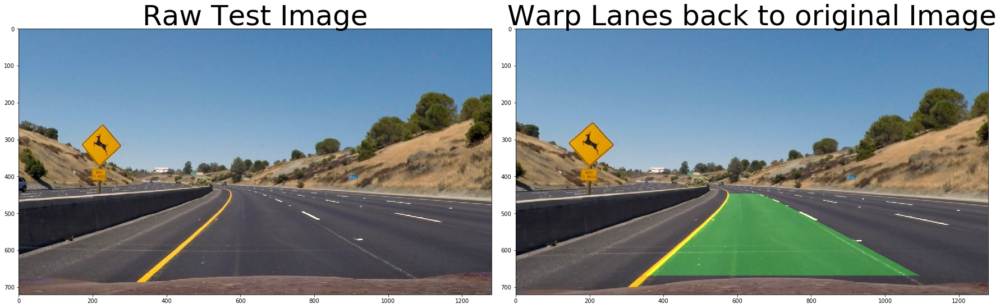

In [26]:
### used in final code
def warp_lanes_back_to_original_image(warped, left_fitx, right_fitx, ploty, Minv, image, undistorted):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return result

### used in final code
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
#     # Colors in the left and right lane regions
#     out_img[lefty, leftx] = [255, 0, 0]
#     out_img[righty, rightx] = [0, 0, 255]
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    return left_fit,right_fit, left_fit_cr,right_fit_cr  

### used in final code
def find_best_lanes(binary_warped, Minv, image, undistorted):
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fit,right_fit, left_fit_cr,right_fit_cr = fit_polynomial(binary_warped)

    # calculate curvature
    left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit_cr, right_fit_cr)
    
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    center_diff, side_pos = calculate_camera_center(warped, left_fitx, right_fitx)
    warp_lanes_back = warp_lanes_back_to_original_image(warped, left_fitx, right_fitx, ploty, Minv, image, undistorted)
    return left_curverad, right_curverad, warp_lanes_back, center_diff, side_pos
img = None
warp_lanes_back= None


# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    left_curverad, right_curverad, warp_lanes_back, center_diff, side_pos = find_best_lanes(warped, Minv, img, undistorted)
    cv2.imwrite("./output_images/warp_back_original_image/warp_back_original_"+str(idx)+".jpg",warp_lanes_back)

if warp_lanes_back is not None:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(warp_lanes_back, cv2.COLOR_BGR2RGB))
    ax2.set_title('Warp Lanes back to original Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

## 8.Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

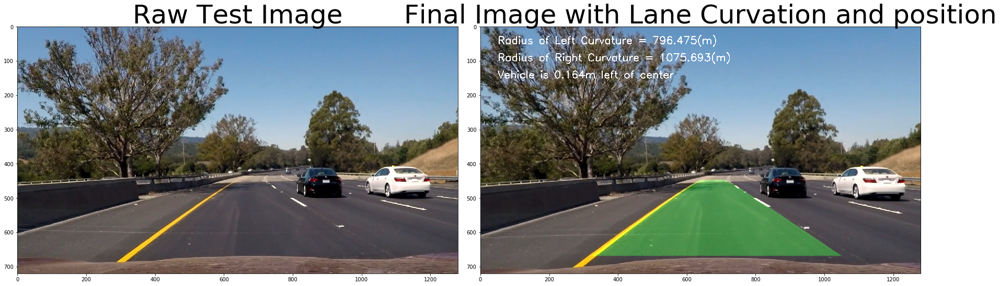

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


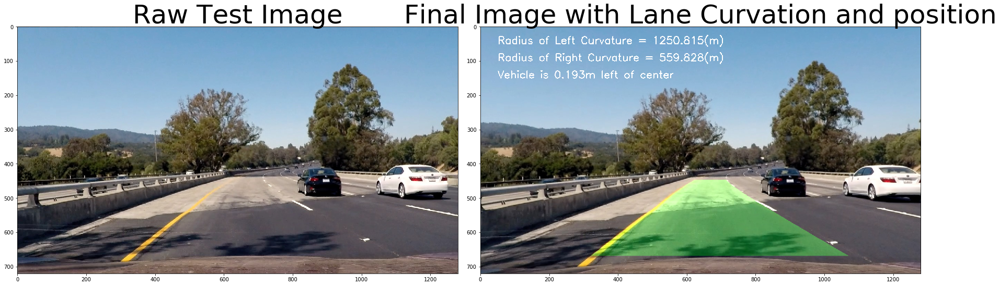

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


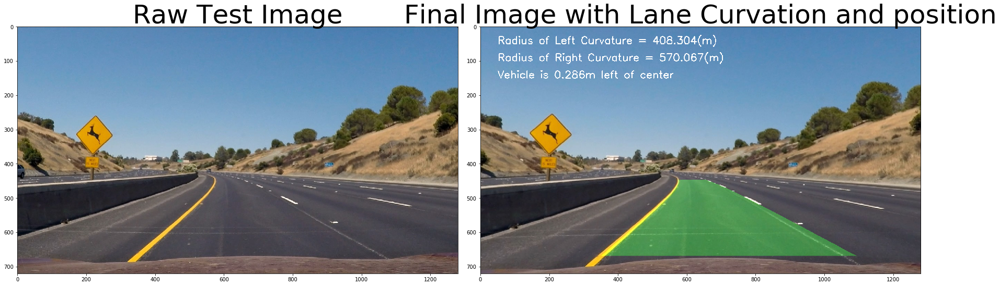

In [29]:
# Step through the list test images and undistort the images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    left_curverad, right_curverad, result, center_diff, side_pos = find_best_lanes(warped, 
                                                                    Minv, 
                                                                    img, 
                                                                    undistorted)
    # draw the text information about curvature, offset and speed
    cv2.putText(result, 'Radius of Left Curvature = '+ str(round(left_curverad,3))+ '(m)', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    cv2.putText(result, 'Radius of Right Curvature = '+ str(round(right_curverad,3))+ '(m)', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    cv2.putText(result, 'Vehicle is '+ str(abs(round(center_diff,3)))+ 'm ' + side_pos + ' of center', (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    cv2.imwrite("./output_images/final_image_with_text_info/final_image_"+str(idx)+".jpg",result)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Raw Test Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Final Image with Lane Curvation and position', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

## Final code, working on Videos

In [ ]:
def is_lane_valid(left_fit, right_fit):
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False

    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)
        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)
        
        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.1:
            status = True
        else:
            status = False
            
    return status

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

window_width =25
window_height = 80
margin = 25
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
my_smooth_factor=15

class Line():
    def __init__(self):
        ## count of total valid polyfit so far
        self.valid_fit_counter = 0
        self.reset_counter = 0
        ## previous left lane polyfit
        self.last_left_fit = None
        ## previous right lane polyfit
        self.last_right_fit = None
        ## current left lane polyfit
        self.left_fit = None
        ## current right lane polyfit
        self.right_fit = None
        
line = Line()


## get new left_fit and right_fit based on previous left_fit and right_fit
def find_best_lanes_basedon_previous_polyfit(left_fit, right_fit, binary_warped):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 40
    # find the left lane pixel indices which have values between the +/- buffer margin of the polyline x
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                       & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    if len(leftx) == 0:
        left_fit_new =[]
    else:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit_new =[]
    else:
        right_fit_new = np.polyfit(righty, rightx, 2)
     
    return left_fit_new, right_fit_new

## all in one method, also 
def find_best_lanes_per_img(img):
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary = combine_gradient_color_s_channel(undistorted)
    
    warped, Minv = find_warped_birdeye_img(combined_binary)
    
    if lane.counter == 0:
        left_fitx,right_fitx, left_curverad,right_curverad = find_best_lanes(binary_warped)
    else:
        lane.left_fit, lane.right_fit  = find_best_lanes_basedon_previous_polyfit(lane.left_fit, lane.right_fit, warped_img)
    
    #Sanity check
    status = is_lane_valid(lane.left_fit, lane.right_fit)
    
    if status == True:        
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.counter += 1
        lane.reset_counter = 0
    else:   
        #Reset
        if lane.reset_counter > 5:
            left_fitx,right_fitx, left_curverad,right_curverad = find_best_lanes(binary_warped)
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right
            
        lane.reset_counter += 1
    
    return warped_img, lane.left_fit, lane.right_fit, M
 
#curve_centers = tracker(window_width, window_height, ym_per_pix/3, xm_per_pix *2, my_smooth_factor)

def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_best_lanes_per_img(img)
    left_curvature, right_curvature, center = radius_curvature(warped_img, left_fit, right_fit)
    
    return draw_on_image(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, show_values)
    

In [ ]:
white_output = 'output_video/project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline).subclip(0,5)
%time white_clip.write_videofile(white_output, audio=False)